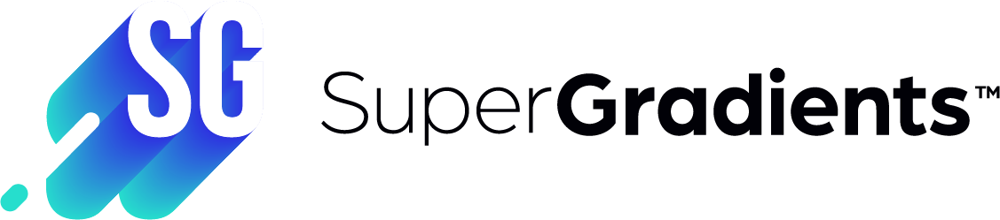

# Object Detection Transfer Learning with SuperGradients

In the following tutorial, we will demonstrate how to use one of SuperGradients pre-trained models and a custom dataset to improve the model's
accuracy using transfer learning for object detection.

Transfer Learning from a pre-trained checkpoint on your own dataset could prove to be very effective instead of deploying the pre-trained model directly on your data or training a model from scratch.
For more information on Transfer Learning, please visit: https://cs231n.github.io/transfer-learning/

In the following example, transfer learning will be used from a COCO2017-pretrained YoloXNano model to a custom dataset - a subset of the Pascal VOC 2012 and Pascal VOC 2007 datasets which only has "person" class images and labels.
Using SuperGradients's dataset sub-classing feature will allow you to generate a partial sub-dataset that has only images and labels covering the desired class(es)

An example real-world use-case of the afformentioned scenario is a surveillance system that detects people.


The notebook is divided into 5 sections:
- Experiment setup
- Dataset definition
- Model definition
- Training setup
- Training and Evaluation




Requirements: super-gradients library

In [1]:
! pip install super_gradients gwpy &> /dev/null
! pip install matplotlib==3.1.3 &> /dev/null

# 1. Experiment setup

We will first initialize our **trainer** which will be in charge of everything, like training, evaluation, saving checkpoints, plotting etc.

The **experiment name** argument is important as every checkpoints, logs and tensorboards to be saved in a directory with the same name. This directory will be created as a sub-directory of **ckpt_root_dir** as follow:

```
ckpt_root_dir
|─── experiment_name_1
│       ckpt_best.pth                     # Model checkpoint on best epoch
│       ckpt_latest.pth                   # Model checkpoint on last epoch
│       average_model.pth                 # Model checkpoint averaged over epochs
│       events.out.tfevents.1659878383... # Tensorflow artifacts of a specific run
│       log_Aug07_11_52_48.txt            # Trainer logs of a specific run
└─── experiment_name_2
        ...
```

In [26]:
from super_gradients.training import SgModel

CHECKPOINT_DIR = "/home/notebook_ckpts/" # We save it as a variable since we need it to start the tensorboard
trainer = SgModel(experiment_name="yoloxs_quickstart_detection_transfer_learning", ckpt_root_dir=CHECKPOINT_DIR)

# 2. Dataset definition

Super-Gradients supports download of PascalVOC, so you don't need to download it yourself. All you need to do is to fill the dataset params and add a flag to say that you want to download:

In [27]:
from super_gradients.training.transforms.transforms import (
    DetectionTargetsFormatTransform,
    DetectionPaddedRescale,
    DetectionMosaic,
    DetectionRandomAffine,
    DetectionMixup,
    DetectionHSV,
    DetectionHorizontalFlip
)
from super_gradients.training.utils.detection_utils import (
    DetectionTargetsFormat,
    DetectionCollateFN,
    CrowdDetectionCollateFN
)

train_image_size, val_image_size = 640, 640
train_input_dim = (train_image_size, train_image_size)
val_input_dim = (val_image_size, val_image_size)

DATA_DIR = "/home/data/pascalVOC/"
dataset_params = {
    "data_dir": DATA_DIR,
    "download": True,     # It will download in data_dir

    "batch_size": 16,
    "val_batch_size": 16,
    "train_image_size": train_image_size,
    "val_image_size": val_image_size,

    # Transforms that will be applied on the raw data by the data loader
    "train_transforms": [
        DetectionPaddedRescale(input_dim=train_input_dim),
        DetectionTargetsFormatTransform(input_format=DetectionTargetsFormat.XYXY_LABEL,
                                        output_format=DetectionTargetsFormat.LABEL_CXCYWH)],
    "val_transforms": [
        DetectionPaddedRescale(input_dim=val_input_dim),
        DetectionTargetsFormatTransform(input_format=DetectionTargetsFormat.XYXY_LABEL,
                                        output_format=DetectionTargetsFormat.LABEL_CXCYWH)],


    # Collate fonctions that combine single image/annotation together into a batch
    "train_collate_fn": DetectionCollateFN(),
    "val_collate_fn": DetectionCollateFN(),

    # The images can be loaded into cache to run faster at the expense of more ram usage
    "cache_dir": DATA_DIR + "cache",
    "cache_train_images": False,
    "cache_val_images": False,

    # We only want the class "person"
    "class_inclusion_list": ["person"],
}


Now we can build a **dataset interface**, which is a simple way to instantiate the train and val sets based on our dataset_params. This is the standard approach in super-gradients.

In [28]:
from super_gradients.training.datasets.dataset_interfaces.dataset_interface import PascalVOCUnifiedDetectionDatasetInterface

dataset_interface = PascalVOCUnifiedDetectionDatasetInterface(dataset_params)

Caching annotations: 100%|██████████| 4952/4952 [00:05<00:00, 906.21it/s] 


This dataset interface will be used by the trainer during training, you just need to connect both together.

In [29]:
trainer.connect_dataset_interface(dataset_interface)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


This interface holds trainsets and valsets that inherit from torch datasets:

In [30]:
trainset, valset = dataset_interface.trainset, dataset_interface.valset

In [31]:
image, labels = next(iter(trainset))
print(f"Image shape {image.shape}")
print(f"Label shape: {labels.shape}")

Image shape (3, 640, 640)
Label shape: (120, 5)


As you can see, the images are resized into 640x640, and the labels are padded to 120 targets.

Let's visualize some images:

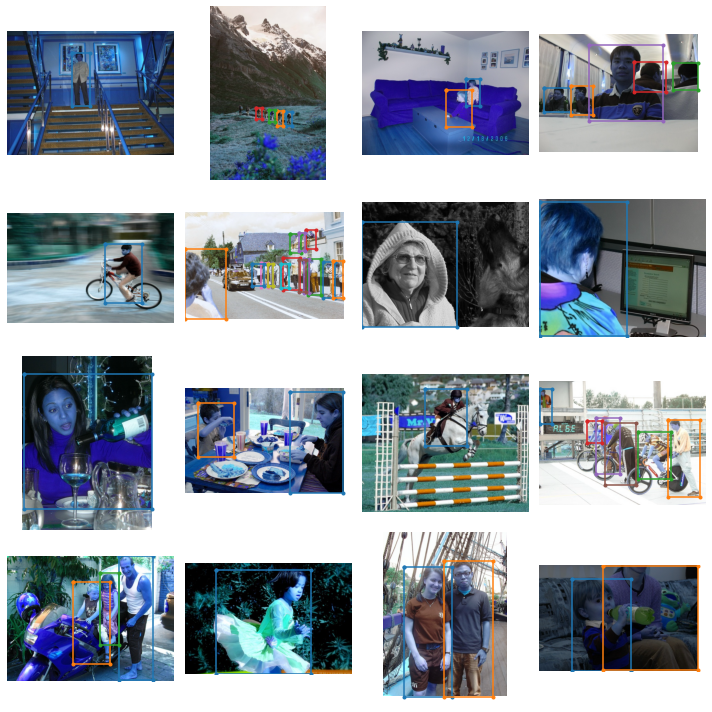

In [32]:
dataset_interface.valset.plot(max_samples_per_plot=16, plot_transformed_data=False)

As you can see, we only kept the boxes that include a person.

*Now that our Data is ready let's build our model*

# 3. Model Definition

This is where the magic happens - SuperGradients automatically replaces the head when loading a pre-trained model that was trained on a different number of classes than the new dataset that it is connected to.
In this example a new head is assembled that will be used to train object detection on a single class (Person class)

*Since the new number of classes in the Person Detection dataset (1 class) is different from the pre-trained model's number of classes
(80 classes) build_model implicitly replaces the detection head automatically to train on the new dataset.
Notice we are also passing our newly generated anchors through 'arch_params'.


In [33]:
trainer.build_model(architecture="yolox_n",
                    arch_params={"num_classes": 1},
                    checkpoint_params={"pretrained_weights": "coco"})

And that's it!

*Now that we have our data and our model, we can see how to train our model* 

# 4. Training setup

As expected, the model does not predict anything.
Let's now setup the training

In [34]:
from super_gradients.examples.notebooks_params.quickstart_detection_transfer_learning import DEFAULT_TRAINING_PARAMS as training_params

print(training_params)

{'max_epochs': 3, 'lr_mode': 'cosine', 'initial_lr': 0.02, 'cosine_final_lr_ratio': 0.05, 'lr_warmup_epochs': 2, 'warmup_bias_lr': 0.05, 'loss': 'yolox_loss', 'loss_logging_items_names': ['iou', 'obj', 'cls', 'l1', 'num_fg', 'Loss'], 'criterion_params': {'strides': [8, 16, 32], 'num_classes': 1}, 'optimizer': 'SGD', 'warmup_momentum': 0.5, 'optimizer_params': {'momentum': 0.9, 'weight_decay': 0.0001, 'nesterov': True}, 'ema': True, 'train_metrics_list': [], 'valid_metrics_list': [DetectionMetrics(
  (post_prediction_callback): YoloPostPredictionCallback()
)], 'metric_to_watch': 'mAP@0.50:0.95', 'greater_metric_to_watch_is_better': True, 'phase_callbacks': [DetectionVisualizationCallback], 'forward_pass_prep_fn': <super_gradients.training.datasets.datasets_utils.DetectionMultiscalePrePredictionCallback object at 0x7fc7894f4e50>}


Now let's modify some of the default parameters

In [35]:
training_params["max_epochs"] = 3
training_params["lr_mode"] = "cosine"
training_params["cosine_final_lr_ratio"] = 0.05
training_params["initial_lr"] = 0.02

We also want to to add a validation metric. To do so we need to precise a **post_prediction_callback**, which is very important because it will filter boxes using NMS before computing the metric. The implementation for Yolox is called **YoloPostPredictionCallback**

In [36]:
from super_gradients.training.models.detection_models.yolo_base import YoloPostPredictionCallback
from super_gradients.training.metrics.detection_metrics import DetectionMetrics

post_prediction_callback = YoloPostPredictionCallback(iou=0.65, conf=0.01)
metric = DetectionMetrics(post_prediction_callback=post_prediction_callback,
                          normalize_targets=True,
                          num_cls=len(dataset_interface.classes))
training_params["valid_metrics_list"] = [metric]

Beside, we want to visualize our results on tensorboard. To do so you can use a Callback defined specifically for that use case:

In [37]:
from super_gradients.training.utils.callbacks import Phase, DetectionVisualizationCallback

# To avoid very low confidence predictions, we set the confident threshold to 0.1 to only have boxes with confidence >0.1
visualization_post_prediction_callback = YoloPostPredictionCallback(iou=0.65, conf=0.1)

visualization_callback = DetectionVisualizationCallback(phase=Phase.VALIDATION_BATCH_END,  # When you you want to visualize the results
                                                        freq=1,
                                                        post_prediction_callback=visualization_post_prediction_callback,
                                                        classes=dataset_interface.classes,
                                                        batch_idx = 0,
                                                        last_img_idx_in_batch=8)
training_params["phase_callbacks"] =  [visualization_callback]

In [38]:
print(f"Training parameters: {training_params}")

Training parameters: {'max_epochs': 3, 'lr_mode': 'cosine', 'initial_lr': 0.02, 'cosine_final_lr_ratio': 0.05, 'lr_warmup_epochs': 2, 'warmup_bias_lr': 0.05, 'loss': 'yolox_loss', 'loss_logging_items_names': ['iou', 'obj', 'cls', 'l1', 'num_fg', 'Loss'], 'criterion_params': {'strides': [8, 16, 32], 'num_classes': 1}, 'optimizer': 'SGD', 'warmup_momentum': 0.5, 'optimizer_params': {'momentum': 0.9, 'weight_decay': 0.0001, 'nesterov': True}, 'ema': True, 'train_metrics_list': [], 'valid_metrics_list': [DetectionMetrics(
  (post_prediction_callback): YoloPostPredictionCallback()
)], 'metric_to_watch': 'mAP@0.50:0.95', 'greater_metric_to_watch_is_better': True, 'phase_callbacks': [DetectionVisualizationCallback], 'forward_pass_prep_fn': <super_gradients.training.datasets.datasets_utils.DetectionMultiscalePrePredictionCallback object at 0x7fc7894f4e50>}


*Now we're ready to run!*

# 5. Training and evaluation

#### 5.A. Evaluation before fine tuning

Let's first evaluate our pretrained model:

In [39]:
original_model_validation_results = trainer.test(test_loader=trainer.valid_loader, test_metrics_list=[metric], metrics_progress_verbose=True)

Test:   0%|          | 0/126 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Test: 100%|██████████| 126/126 [00:23<00:00,  5.27it/s, F1=0, Precision=0, Recall=0, mAP@0.50:0.95=0]


We can see that before training the new head we get mean average precision (mAP), Precision and Recall of 0.

Please note that precision and recall are computed with a threshold confidence of 50% (i.e. we drop predictions with a confidence level < 0.5)

*Now let's train*

#### 5.B. Training

Let's instantiate a tensorboard to visualize our results.

*Don't forget to refresh the tensorboard while training with the arrow on the top right of the tensorboard cell.*

In [40]:
%load_ext tensorboard
%tensorboard --logdir $CHECKPOINT_DIR --bind_all

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [41]:
trainer.train(training_params)

sg_model -INFO- Using EMA with params {}
"events.out.tfevents.1660419901.d86fd0bce993.71.0" will not be deleted
sg_model -INFO- Started training for 3 epochs (0/2)



Train epoch 0:   0%|          | 0/381 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/torch/cuda/memory.py:393: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  FutureWarning)
Validation epoch 0: 100%|██████████| 126/126 [00:34<00:00,  3.61it/s]


SUMMARY OF EPOCH 0
├── Training
│   ├── Cls = 0.7392
│   ├── Iou = 0.6803
│   ├── L1 = 0.0
│   ├── Loss = 8.4946
│   ├── Num_fg = 3.9237
│   └── Obj = 4.354
└── Validation
    ├── Cls = 0.6997
    ├── Iou = 0.6524
    ├── L1 = 0.0
    ├── Loss = 8.0957
    ├── Map@0.50:0.95 = 0.0269
    ├── Num_fg = 4.5057
    └── Obj = 4.1341

base_sg_logger -INFO- Checkpoint saved in /home/notebook_ckpts/yoloxs_quickstart_detection_transfer_learning/ckpt_best.pth
sg_model -INFO- Best checkpoint overriden: validation mAP@0.50:0.95: 0.026914870366454124


Validation epoch 1: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]


SUMMARY OF EPOCH 1
├── Training
│   ├── Cls = 0.6775
│   │   ├── Best until now = 0.7392 (↘ -0.0617)
│   │   └── Epoch N-1      = 0.7392 (↘ -0.0617)
│   ├── Iou = 0.6313
│   │   ├── Best until now = 0.6803 (↘ -0.049)
│   │   └── Epoch N-1      = 0.6803 (↘ -0.049)
│   ├── L1 = 0.0
│   │   ├── Best until now = 0.0    (↘ 0.0)
│   │   └── Epoch N-1      = 0.0    (↘ 0.0)
│   ├── Loss = 7.3999
│   │   ├── Best until now = 8.4946 (↘ -1.0948)
│   │   └── Epoch N-1      = 8.4946 (↘ -1.0948)
│   ├── Num_fg = 4.7756
│   │   ├── Best until now = 3.9237 (↗ 0.8518)
│   │   └── Epoch N-1      = 3.9237 (↗ 0.8518)
│   └── Obj = 3.5661
│       ├── Best until now = 4.354  (↘ -0.788)
│       └── Epoch N-1      = 4.354  (↘ -0.788)
└── Validation
    ├── Cls = 0.6838
    │   ├── Best until now = 0.6997 (↘ -0.0159)
    │   └── Epoch N-1      = 0.6997 (↘ -0.0159)
    ├── Iou = 0.6279
    │   ├── Best until now = 0.6524 (↘ -0.0245)
    │   └── Epoch N-1      = 0.6524 (↘ -0.0245)
    ├── L1 = 0.0
    │   ├── Be

Validation epoch 2: 100%|██████████| 126/126 [00:35<00:00,  3.52it/s]


SUMMARY OF EPOCH 2
├── Training
│   ├── Cls = 0.6628
│   │   ├── Best until now = 0.6775 (↘ -0.0146)
│   │   └── Epoch N-1      = 0.6775 (↘ -0.0146)
│   ├── Iou = 0.5992
│   │   ├── Best until now = 0.6313 (↘ -0.0321)
│   │   └── Epoch N-1      = 0.6313 (↘ -0.0321)
│   ├── L1 = 0.0
│   │   ├── Best until now = 0.0    (↘ 0.0)
│   │   └── Epoch N-1      = 0.0    (↘ 0.0)
│   ├── Loss = 6.6103
│   │   ├── Best until now = 7.3999 (↘ -0.7896)
│   │   └── Epoch N-1      = 7.3999 (↘ -0.7896)
│   ├── Num_fg = 5.1598
│   │   ├── Best until now = 3.9237 (↗ 1.2361)
│   │   └── Epoch N-1      = 4.7756 (↗ 0.3842)
│   └── Obj = 2.9516
│       ├── Best until now = 3.5661 (↘ -0.6144)
│       └── Epoch N-1      = 3.5661 (↘ -0.6144)
└── Validation
    ├── Cls = 0.6862
    │   ├── Best until now = 0.6838 (↗ 0.0024)
    │   └── Epoch N-1      = 0.6838 (↗ 0.0024)
    ├── Iou = 0.6286
    │   ├── Best until now = 0.6279 (↗ 0.0007)
    │   └── Epoch N-1      = 0.6279 (↗ 0.0007)
    ├── L1 = 0.0
    │   ├── Be

Validation epoch 3: 100%|██████████| 126/126 [00:35<00:00,  3.59it/s]


SUMMARY OF EPOCH 3
├── Training
│   ├── Cls = 0.6628
│   │   ├── Best until now = 0.6775 (↘ -0.0146)
│   │   └── Epoch N-1      = 0.6775 (↘ -0.0146)
│   ├── Iou = 0.5992
│   │   ├── Best until now = 0.6313 (↘ -0.0321)
│   │   └── Epoch N-1      = 0.6313 (↘ -0.0321)
│   ├── L1 = 0.0
│   │   ├── Best until now = 0.0    (↘ 0.0)
│   │   └── Epoch N-1      = 0.0    (↘ 0.0)
│   ├── Loss = 6.6103
│   │   ├── Best until now = 7.3999 (↘ -0.7896)
│   │   └── Epoch N-1      = 7.3999 (↘ -0.7896)
│   ├── Num_fg = 5.1598
│   │   ├── Best until now = 3.9237 (↗ 1.2361)
│   │   └── Epoch N-1      = 4.7756 (↗ 0.3842)
│   └── Obj = 2.9516
│       ├── Best until now = 3.5661 (↘ -0.6144)
│       └── Epoch N-1      = 3.5661 (↘ -0.6144)
└── Validation
    ├── Cls = 0.6883
    │   ├── Best until now = 0.6838 (↗ 0.0045)
    │   └── Epoch N-1      = 0.6862 (↗ 0.0021)
    ├── Iou = 0.6331
    │   ├── Best until now = 0.6279 (↗ 0.0052)
    │   └── Epoch N-1      = 0.6286 (↗ 0.0045)
    ├── L1 = 0.0
    │   ├── Be

*Note: you can check the tensorboard while training*

#### 5.C. Evaluation after training

In [42]:
original_model_validation_results = trainer.test(test_loader=trainer.valid_loader, test_metrics_list=[metric], metrics_progress_verbose=True)

Test:   0%|          | 0/126 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Test: 100%|██████████| 126/126 [00:38<00:00,  3.24it/s, F1=0.238, Loss=7.75, Precision=0.293, Recall=0.201, cls=0.686, iou=0.629, l1=0, mAP@0.50:0.95=0.039, num_fg=4.73, obj=3.92]


After only a few minutes of training we already have:
- 3.9% mAP
- 29.3% Precision
- 20.1% Recall

*Precision and Recall are computed for a threshold of 50% confidence*


You can check the predicitions in the tensorboard above, you will see the improvement over the training!

Feel free to tune the hyperparameters and to run longer to further increase the predictions.

# Summary

This tutorial demonstrated how simple it is to use transfer learning from a pre-trained SuperGradients model to a new dataset.
You can visit our documentation to further learn how to integrate your own Dataset to truly benefit from the principles shown in this tutorial:
https://deci-ai.github.io/super-gradients/